In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from prophet import Prophet
from statsmodels.tools.eval_measures import rmse
from prophet.plot import plot_plotly, plot_components_plotly
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler, LabelEncoder

In [2]:
sensor_data = pd.read_csv('C:/Users/ankus/sensor.csv')
print(sensor_data, 'sensor_data')
sensor_data = sensor_data.drop(['motion'], axis = 1)#It only has false values
sensor_data['time'] = pd.to_datetime(sensor_data['ts'], unit="s")
sensor_data = sensor_data.drop(['ts', 'device'], axis = 1)
sensor_data = sensor_data.drop(['lpg', 'smoke', 'co', 'light'], axis = 1)#these columns have high correlation
df = sensor_data.rename(columns={'time': 'ds', 'temp': 'y', 'humidity': 'humidity', 'device': 'device'})
df

                  ts             device        co   humidity  light       lpg  \
0       1.594512e+09  b8:27:eb:bf:9d:51  0.004956  51.000000  False  0.007651   
1       1.594512e+09  00:0f:00:70:91:0a  0.002840  76.000000  False  0.005114   
2       1.594512e+09  b8:27:eb:bf:9d:51  0.004976  50.900000  False  0.007673   
3       1.594512e+09  1c:bf:ce:15:ec:4d  0.004403  76.800003   True  0.007023   
4       1.594512e+09  b8:27:eb:bf:9d:51  0.004967  50.900000  False  0.007664   
...              ...                ...       ...        ...    ...       ...   
405179  1.595203e+09  00:0f:00:70:91:0a  0.003745  75.300003  False  0.006247   
405180  1.595203e+09  b8:27:eb:bf:9d:51  0.005882  48.500000  False  0.008660   
405181  1.595203e+09  1c:bf:ce:15:ec:4d  0.004540  75.699997   True  0.007181   
405182  1.595203e+09  00:0f:00:70:91:0a  0.003745  75.300003  False  0.006247   
405183  1.595203e+09  b8:27:eb:bf:9d:51  0.005914  48.400000  False  0.008695   

        motion     smoke   

,humidity,y,ds
0,51.000000,22.700000,2020-07-12 00:01:34.385974528
1,76.000000,19.700001,2020-07-12 00:01:34.735567616
2,50.900000,22.600000,2020-07-12 00:01:38.073572864
3,76.800003,27.000000,2020-07-12 00:01:39.589145856
4,50.900000,22.600000,2020-07-12 00:01:41.761234944
...,...,...,...
405179,75.300003,19.200001,2020-07-20 00:03:33.162014976
405180,48.500000,22.200000,2020-07-20 00:03:33.576560640
405181,75.699997,26.600000,2020-07-20 00:03:36.167959296
405182,75.300003,19.200001,2020-07-20 00:03:36.979521536


In [3]:
df.set_index('ds', inplace=True)

avg_temp = df.resample('T').mean()

avg_temp = avg_temp.reset_index()
avg_temp

,ds,humidity,y
0,2020-07-12 00:01:00,64.071429,23.764286
1,2020-07-12 00:02:00,64.750000,23.113889
2,2020-07-12 00:03:00,65.816216,22.956757
3,2020-07-12 00:04:00,66.028947,22.881579
4,2020-07-12 00:05:00,64.430303,22.924242
...,...,...,...
11518,2020-07-19 23:59:00,62.268571,21.997143
11519,2020-07-20 00:00:00,61.687500,22.928125
11520,2020-07-20 00:01:00,63.405883,22.561765
11521,2020-07-20 00:02:00,64.347369,22.539474


<Axes: xlabel='ds'>

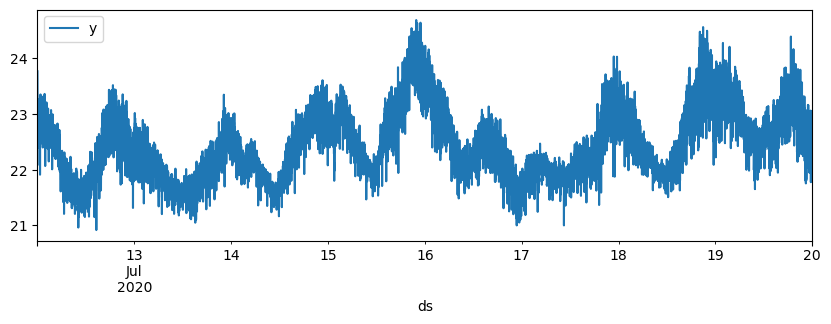

In [4]:
avg_temp.plot(x='ds', y='y', figsize=(10,3))

In [5]:
train = avg_temp.iloc[:len(avg_temp)-2305]
test = avg_temp.iloc[len(avg_temp)-2305:]

In [6]:
train

,ds,humidity,y
0,2020-07-12 00:01:00,64.071429,23.764286
1,2020-07-12 00:02:00,64.750000,23.113889
2,2020-07-12 00:03:00,65.816216,22.956757
3,2020-07-12 00:04:00,66.028947,22.881579
4,2020-07-12 00:05:00,64.430303,22.924242
...,...,...,...
9213,2020-07-18 09:34:00,61.213513,22.137838
9214,2020-07-18 09:35:00,61.848572,21.974286
9215,2020-07-18 09:36:00,61.250000,22.127778
9216,2020-07-18 09:37:00,60.979487,22.079487


In [7]:

model = Prophet()
model.fit(train)

future = model.make_future_dataframe(periods=2305, freq='T')
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

02:48:52 - cmdstanpy - INFO - Chain [1] start processing
02:48:57 - cmdstanpy - INFO - Chain [1] done processing


,ds,yhat,yhat_lower,yhat_upper
0,2020-07-12 00:01:00,23.063965,22.743359,23.373239
1,2020-07-12 00:02:00,23.061183,22.728848,23.413330
2,2020-07-12 00:03:00,23.058403,22.732483,23.403151
3,2020-07-12 00:04:00,23.055625,22.744828,23.389926
4,2020-07-12 00:05:00,23.052849,22.723244,23.365482
...,...,...,...,...
11518,2020-07-19 23:59:00,23.922420,15.138856,31.397094
11519,2020-07-20 00:00:00,23.921271,15.156951,31.513717
11520,2020-07-20 00:01:00,23.920124,15.190816,31.408041
11521,2020-07-20 00:02:00,23.918979,15.048116,31.422339


In [8]:
plot_plotly(model, forecast)

In [9]:
plot_components_plotly(model, forecast)

In [10]:
predictions = forecast.iloc[-2305:]['yhat']
print("RMSE:", rmse(predictions, test['y']))
print("mean:", test['y'].mean())
result_df = pd.DataFrame({'Actual Values': test['y'], 'Predicted Values': predictions})
print(result_df)

RMSE: 0.5824673004543026
mean: 22.838777259724854
       Actual Values  Predicted Values
9218       22.057143         22.195610
9219       21.915152         22.195248
9220       21.821212         22.194899
9221       21.977778         22.194563
9222       21.903030         22.194241
...              ...               ...
11518      21.997143         23.922420
11519      22.928125         23.921271
11520      22.561765         23.920124
11521      22.539474         23.918979
11522      22.458334         23.917835

[2305 rows x 2 columns]


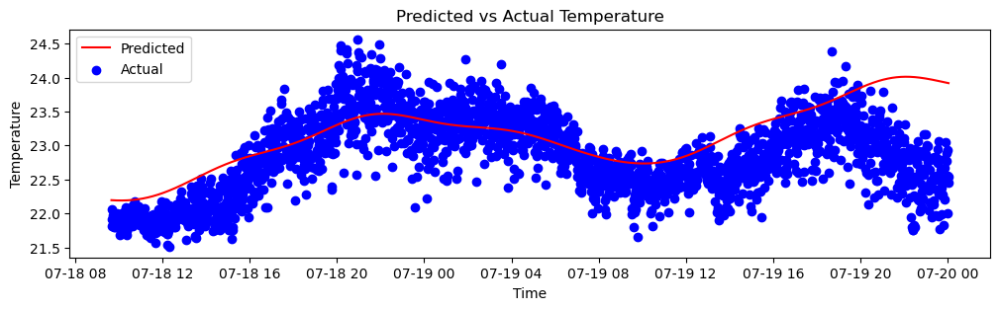

In [11]:
plt.figure(figsize=(12, 3))
plt.plot(test['ds'], predictions, label='Predicted', color='red')
plt.scatter(test['ds'], test['y'], label='Actual', color='blue')
plt.xlabel('Time')
plt.ylabel('Temperature')
plt.title('Predicted vs Actual Temperature')
plt.legend()
plt.show()